In [1]:
import torch
import torch.nn as nn
from torchvision.models import vgg16
import cv2 as cv
import matplotlib.pyplot as plt
from tqdm import tqdm

In [2]:
class VGGModel(nn.Module):
    def __init__(self):
        super().__init__()
        vgg = vgg16(weights='DEFAULT')
        avg_pool = nn.AvgPool2d(kernel_size=2, stride=2, padding=0, ceil_mode=False)

        self.block1 = nn.ModuleList(vgg.features[:4]) + [avg_pool]
        self.block2 = nn.ModuleList(vgg.features[5:9]) + [avg_pool]
        self.block3 = nn.ModuleList(vgg.features[10:16]) + [avg_pool]
        self.block4 = nn.ModuleList(vgg.features[17:23]) + [avg_pool]
        self.block5 = nn.ModuleList(vgg.features[24:30]) + [avg_pool]

        self.block1 = nn.Sequential(*self.block1)
        self.block2 = nn.Sequential(*self.block2)
        self.block3 = nn.Sequential(*self.block3)
        self.block4 = nn.Sequential(*self.block4)
        self.block5 = nn.Sequential(*self.block5)

    def forward(self, x):
        emb1 = self.block1(x)
        emb2 = self.block2(emb1)
        emb3 = self.block3(emb2)
        emb4 = self.block4(emb3)
        emb5 = self.block5(emb4)
        return emb1, emb2, emb3, emb4, emb5

In [ ]:
vgg = VGGModel()
vgg.eval()

In [77]:
image = cv.imread('lion.png')
#image = cv.resize(image, (244, 244))
image = image
image = torch.from_numpy(image).float().permute(2, 0, 1).unsqueeze(0) / 255.0
input = image.clone().detach().requires_grad_(True)

In [78]:
config = {
    'feature_map_indices': [2],
    'lr': 0.01,
    'min_img_value': 0,
    'max_img_value': 1
}

  0%|          | 0/80 [00:00<?, ?it/s]

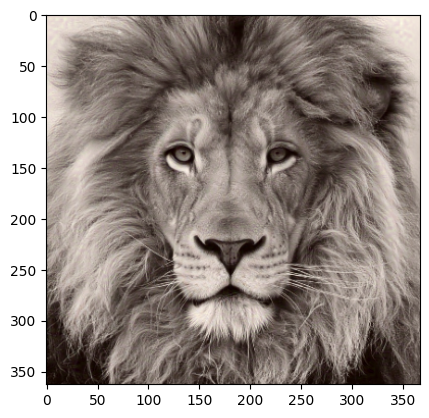

 12%|█▎        | 10/80 [01:00<07:04,  6.07s/it]

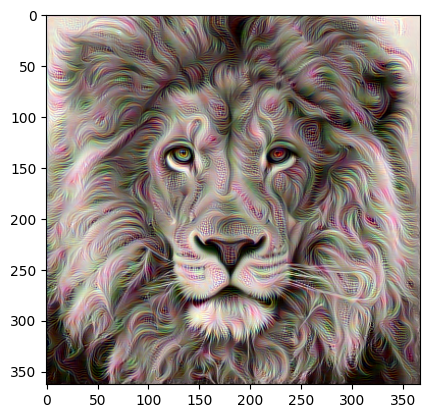

 25%|██▌       | 20/80 [02:03<06:22,  6.38s/it]

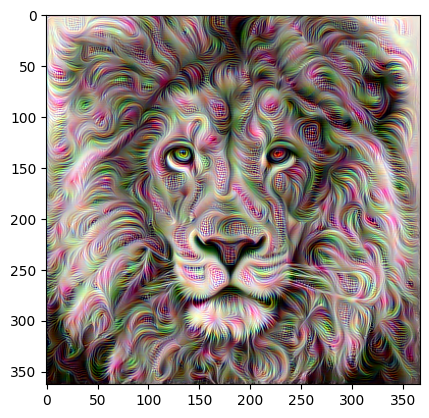

 38%|███▊      | 30/80 [03:07<05:22,  6.46s/it]

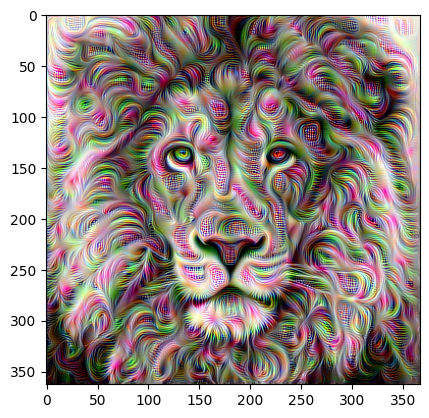

 50%|█████     | 40/80 [04:08<04:01,  6.04s/it]

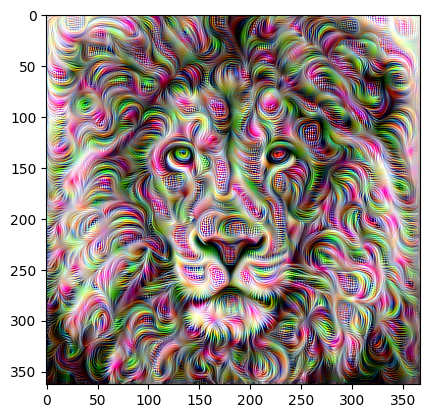

 62%|██████▎   | 50/80 [05:11<03:14,  6.49s/it]

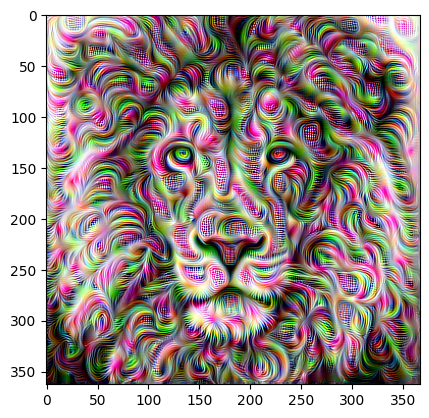

 75%|███████▌  | 60/80 [06:14<02:03,  6.17s/it]

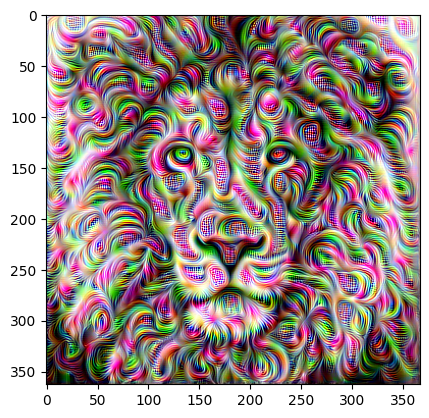

 88%|████████▊ | 70/80 [07:17<01:03,  6.33s/it]

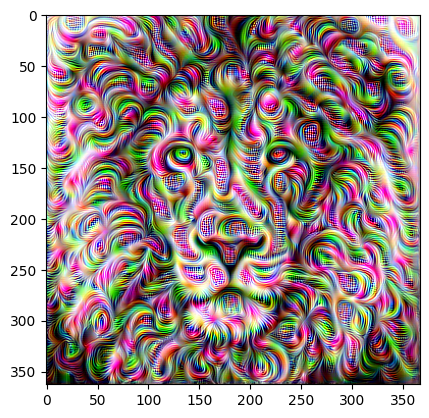

100%|██████████| 80/80 [08:25<00:00,  6.31s/it]


In [79]:
for iter in tqdm(range(80)):
    out = vgg(input)
    layers = [out[l] for l in config['feature_map_indices']]
    loss = 0
    for layer in layers:
        target = torch.zeros_like(layer)
        loss += torch.nn.MSELoss(reduction='mean')(layer, target)
    loss.backward()
    gradient = input.grad.data
    gradient -= gradient.mean()
    gradient /= gradient.std()
    input.data += gradient * config['lr'] # gradient ascent
    input.grad.data.zero_()
    input.data = torch.clamp(input.data, config['min_img_value'], config['max_img_value'])
    if iter % 10 == 0:
        plt.imshow(input.detach().squeeze(0).permute(1, 2, 0).numpy())
        plt.show()

In [74]:
image = cv.imread('lion.png')
#image = cv.resize(image, (244, 244))
image = image
image = torch.from_numpy(image).float().permute(2, 0, 1).unsqueeze(0) / 255.0
input = image.clone().detach().requires_grad_(True)

In [75]:
config = {
    'feature_map_indices': [3],
    'lr': 0.01,
    'min_img_value': 0,
    'max_img_value': 1
}

  0%|          | 0/80 [00:00<?, ?it/s]

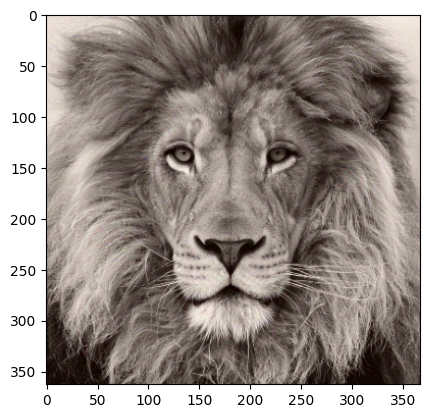

 12%|█▎        | 10/80 [01:15<09:09,  7.85s/it]

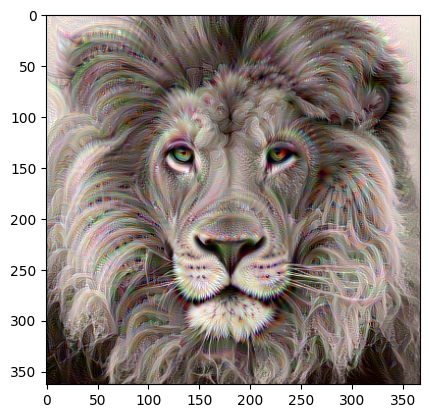

 25%|██▌       | 20/80 [02:33<07:40,  7.68s/it]

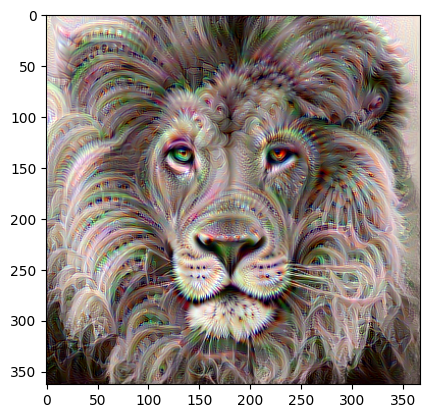

 38%|███▊      | 30/80 [03:52<06:33,  7.87s/it]

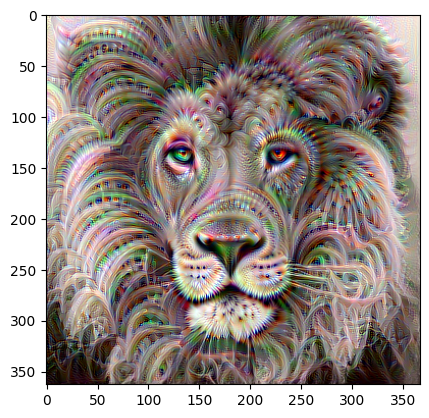

 50%|█████     | 40/80 [05:11<05:13,  7.84s/it]

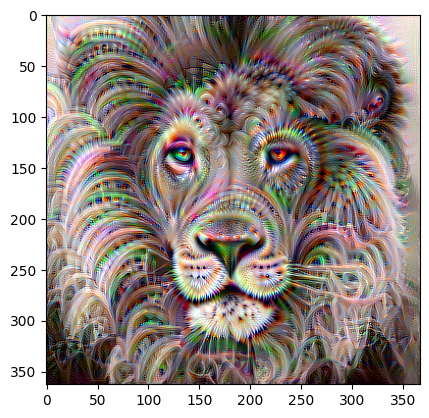

 62%|██████▎   | 50/80 [06:31<04:05,  8.18s/it]

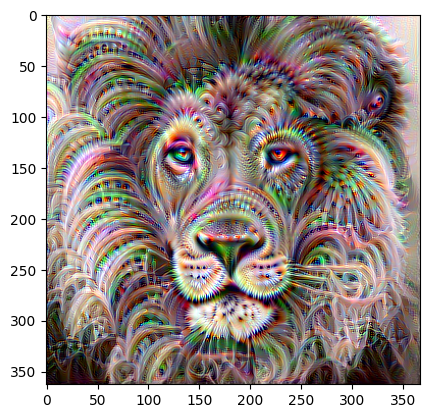

 75%|███████▌  | 60/80 [07:48<02:29,  7.49s/it]

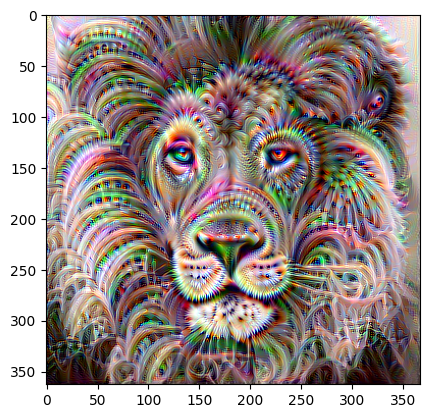

 88%|████████▊ | 70/80 [09:07<01:19,  7.97s/it]

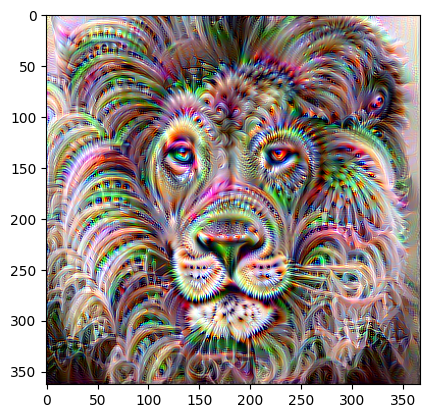

100%|██████████| 80/80 [10:27<00:00,  7.85s/it]


In [76]:
for iter in tqdm(range(80)):
    out = vgg(input)
    layers = [out[l] for l in config['feature_map_indices']]
    loss = 0
    for layer in layers:
        target = torch.zeros_like(layer)
        loss += torch.nn.MSELoss(reduction='mean')(layer, target)
    loss.backward()
    gradient = input.grad.data
    gradient -= gradient.mean()
    gradient /= gradient.std()
    input.data += gradient * config['lr'] # gradient ascent
    input.grad.data.zero_()
    input.data = torch.clamp(input.data, config['min_img_value'], config['max_img_value'])
    if iter % 10 == 0:
        plt.imshow(input.detach().squeeze(0).permute(1, 2, 0).numpy())
        plt.show()

In [71]:
config = {
    'feature_map_indices': [4],
    'lr': 0.01,
    'min_img_value': 0,
    'max_img_value': 1
}

In [72]:
image = cv.imread('lion.png')
#image = cv.resize(image, (244, 244))
image = image
image = torch.from_numpy(image).float().permute(2, 0, 1).unsqueeze(0) / 255.0
input = image.clone().detach().requires_grad_(True)

  0%|          | 0/80 [00:00<?, ?it/s]

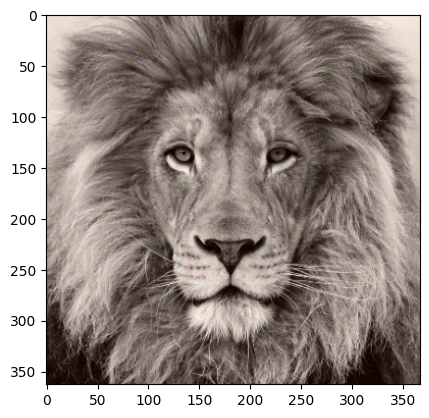

 12%|█▎        | 10/80 [01:19<09:40,  8.29s/it]

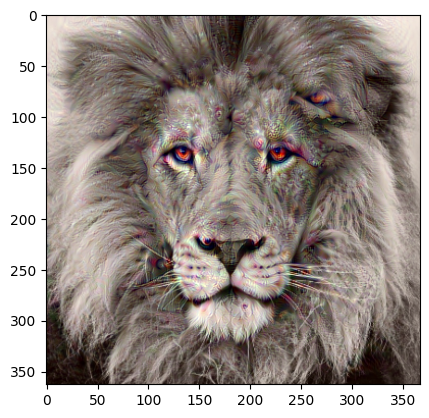

 25%|██▌       | 20/80 [02:44<08:56,  8.94s/it]

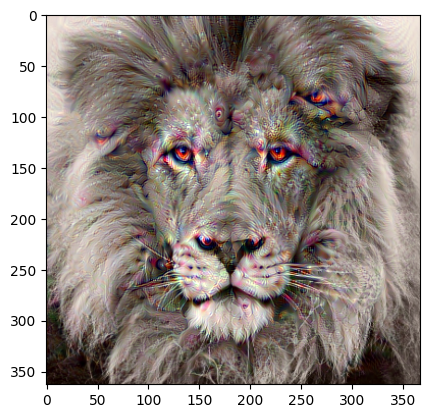

 38%|███▊      | 30/80 [04:09<07:09,  8.59s/it]

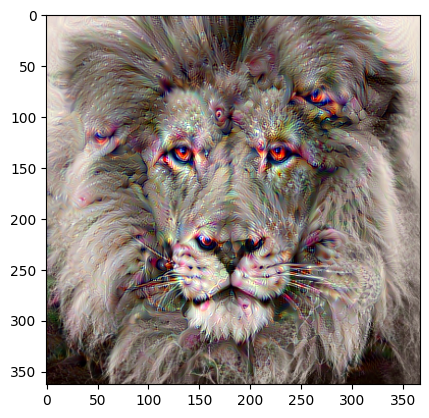

 50%|█████     | 40/80 [05:33<05:38,  8.46s/it]

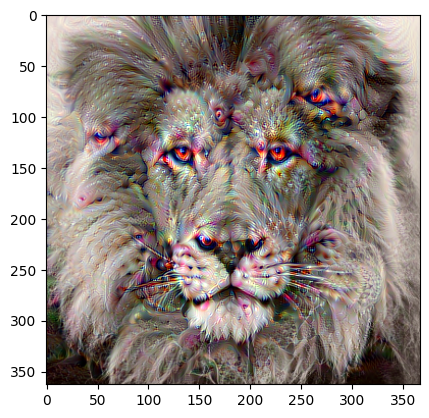

 62%|██████▎   | 50/80 [06:57<04:06,  8.21s/it]

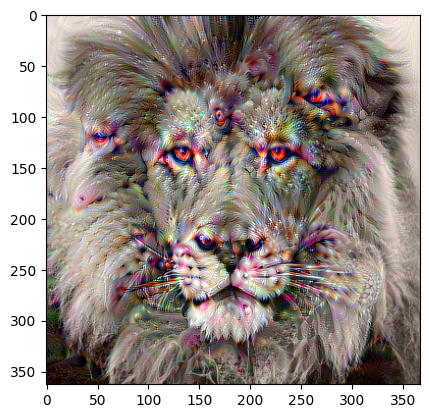

 75%|███████▌  | 60/80 [08:17<02:44,  8.24s/it]

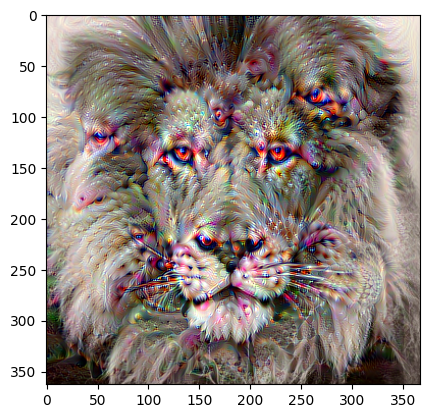

 88%|████████▊ | 70/80 [09:41<01:21,  8.11s/it]

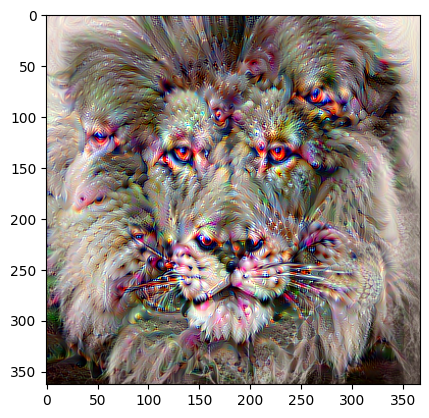

100%|██████████| 80/80 [11:01<00:00,  8.27s/it]


In [73]:
for iter in tqdm(range(80)):
    out = vgg(input)
    layers = [out[l] for l in config['feature_map_indices']]
    loss = 0
    for layer in layers:
        target = torch.zeros_like(layer)
        loss += torch.nn.MSELoss(reduction='mean')(layer, target)
    loss.backward()
    gradient = input.grad.data
    gradient -= gradient.mean()
    gradient /= gradient.std()
    input.data += gradient * config['lr'] # gradient ascent
    input.grad.data.zero_()
    input.data = torch.clamp(input.data, config['min_img_value'], config['max_img_value'])
    if iter % 10 == 0:
        plt.imshow(input.detach().squeeze(0).permute(1, 2, 0).numpy())
        plt.show()